# 라이브러리 불러오기

In [1]:
import pandas as pd
import numpy as np
import random 
import os
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import duckdb
from pathlib import Path
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import permutations

#한글 깨짐 방지
plt.rc('font', family='Malgun Gothic') 
plt.rcParams['axes.unicode_minus'] = False

import warnings
warnings.filterwarnings('ignore')

In [2]:
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

# 데이터 불러오기

In [3]:
data_path = Path('../data')

train = pd.read_csv(data_path / 'train.csv')
test = pd.read_csv(data_path / 'test.csv')
train_target = train['support_needs']

#데이터 구조 확인
train.head()



,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction,support_needs
0,TRAIN_00000,54.0,F,47.0,22.0,8.0,member,90,25.0,0
1,TRAIN_00001,30.0,M,16.0,15.0,5.0,vip,360,23.0,0
2,TRAIN_00002,29.0,M,8.0,30.0,21.0,plus,30,21.0,0
3,TRAIN_00003,38.0,F,38.0,23.0,10.0,vip,90,6.0,0
4,TRAIN_00004,25.0,F,52.0,3.0,17.0,member,30,1.0,2


In [4]:
#EDA
train.describe()
train_cols = [col for col in train.columns if 'ID' not in col]

print(train_cols)

['age', 'gender', 'tenure', 'frequent', 'payment_interval', 'subscription_type', 'contract_length', 'after_interaction', 'support_needs']


# EDA

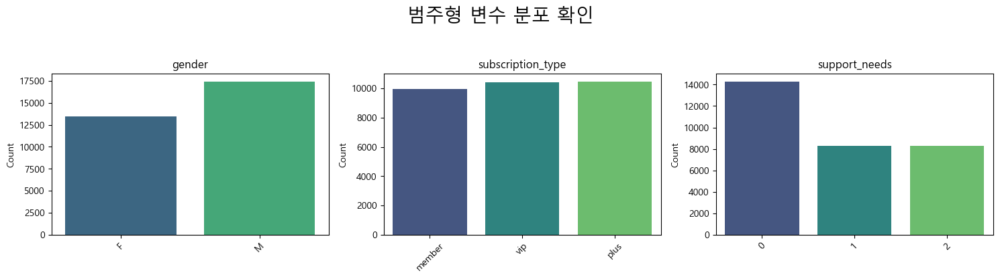

In [5]:
#범주형 변수 리스트
categorical_vars = [
    'gender', 'subscription_type', 'support_needs'
]

#그래프 그리기기
plt.figure(figsize=(15, 10))
plt.suptitle('범주형 변수 분포 확인', fontsize=20)

# 반복문을 통해 각 변수별로 그래프 그리기
for i, var in enumerate(categorical_vars, 1):
    plt.subplot(3, 3, i) # 3x3 격자에 i번째 그래프를 그림
    sns.countplot(x=var, data=train, palette='viridis')
    plt.title(var)
    plt.xlabel('')
    plt.ylabel('Count')
    plt.xticks(rotation=45)

plt.tight_layout(rect=[0, 0, 1, 0.96])

# support_needs 변수가 불균형하다, 어떻게 해결해야 하지?

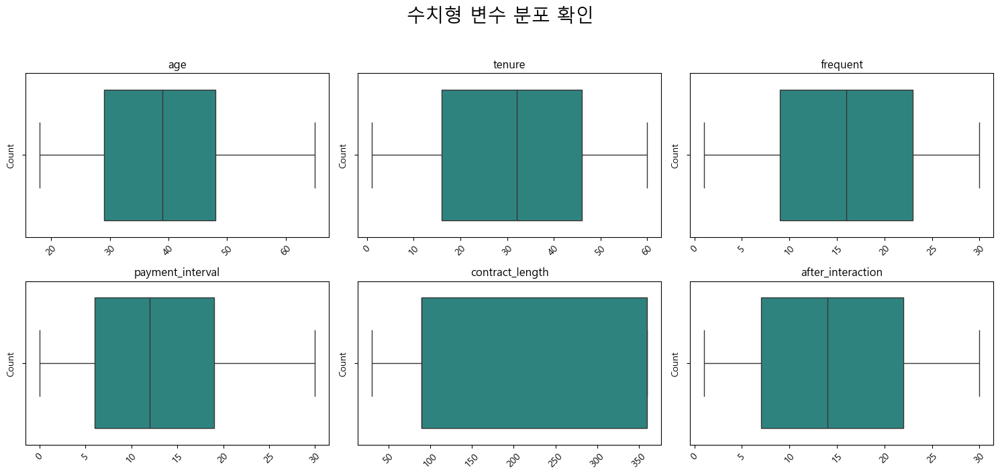

In [42]:
# 수치형 변수 리스트
numerical_vars = ['age', 'tenure', 'frequent', 'payment_interval', 'contract_length', 'after_interaction',]

#그래프 그리기
plt.figure(figsize=(15, 10))
plt.suptitle('수치형 변수 분포 확인', fontsize=20)

# 반복문을 통해 각 변수별로 그래프 그리기
for i, var in enumerate(numerical_vars , 1):
    plt.subplot(3, 3, i) # 3x3 격자에 i번째 그래프를 그림
    sns.boxplot(x=var, data=train, palette='viridis')
    plt.title(var)
    plt.xlabel('')
    plt.ylabel('Count')
    plt.xticks(rotation=45)

plt.tight_layout(rect=[0, 0, 1, 0.96])

# contract_length 가 오른쪽으로 치우쳐졌으니까 지수변환을 해볼수 있겠다
# 오른쪽 = 지수변환
# 왼쪽 = 로그변환


# 나머진 얼추 다 괜찮게 생긴거같다

# 어짜피 트리기반 쓸거라 상관없긴한데

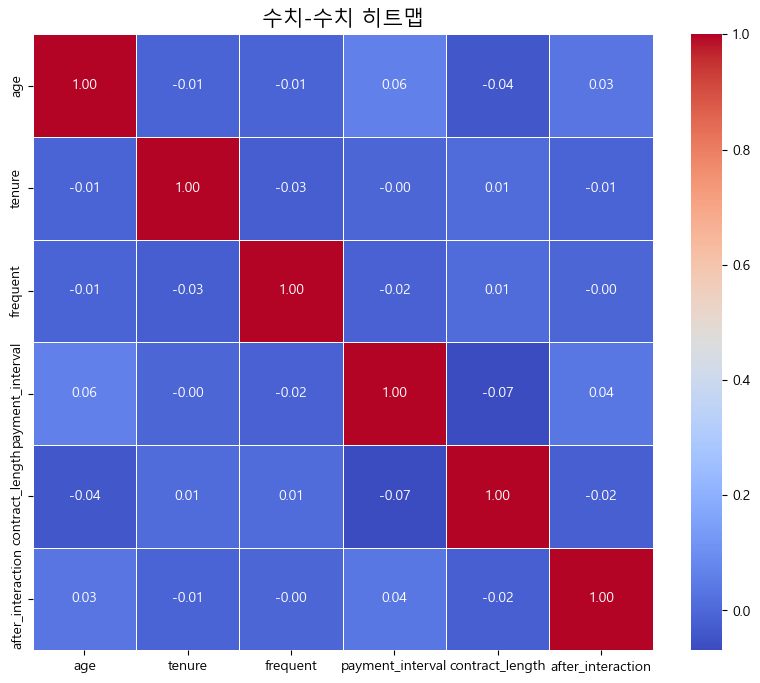

In [8]:
# 수치형 변수들 히트맵 그리기
corr_matrix_numerical = train[numerical_vars].corr()

# 2. 히트맵 그리기
plt.figure(figsize=(10, 8)) # 그래프 크기 설정
sns.heatmap(
    corr_matrix_numerical,
    annot=True,      # 각 셀에 값(상관계수) 표시
    cmap='coolwarm', # 색상 스타일 지정 (양수는 붉은색, 음수는 푸른색)
    fmt='.2f',       # 소수점 둘째 자리까지 표시
    linewidths=.5    # 셀 사이의 경계선 두께
)
plt.title('수치-수치 히트맵', fontsize=15)
plt.show()

# 수치형끼리는 전부 다 독립으로 보임

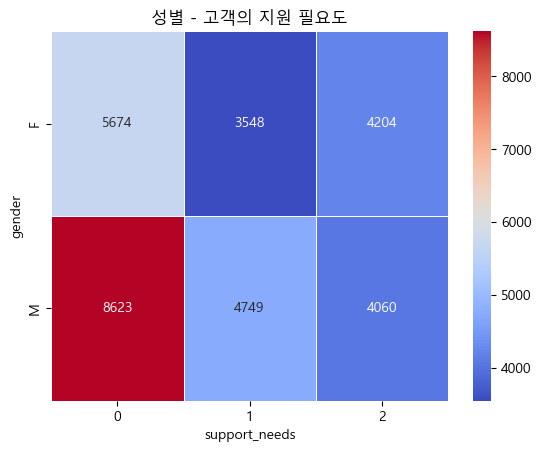

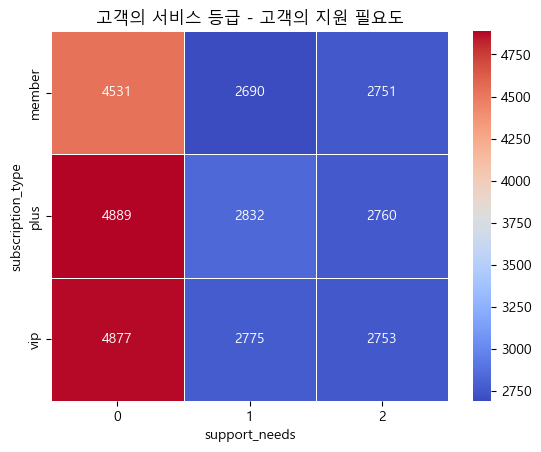

In [9]:
# 범주형 - 범주형 상관계수

# 성별 - 고객의 지원 필요도
cross_table = pd.crosstab(train['gender'],train['support_needs'])
sns.heatmap(cross_table, annot=True, cmap ='coolwarm',fmt='d',linewidths=.5 )
plt.title('성별 - 고객의 지원 필요도')
plt.show()

# 고객의 서비스 등급 - 고객의 지원 필요도
cross_table = pd.crosstab(train['subscription_type'],train['support_needs'])
sns.heatmap(cross_table, annot=True, cmap ='coolwarm',fmt='d',linewidths=.5  )
plt.title('고객의 서비스 등급 - 고객의 지원 필요도')
plt.show()

# support_needs 에 0이 많아서 그래보이는 것 같다

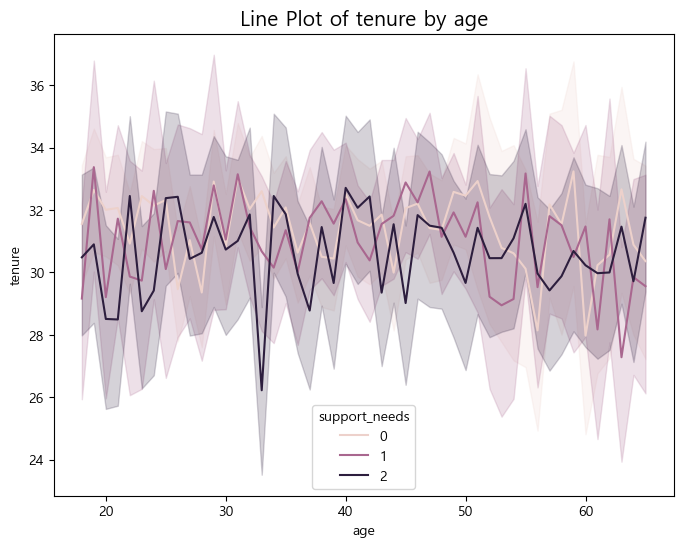

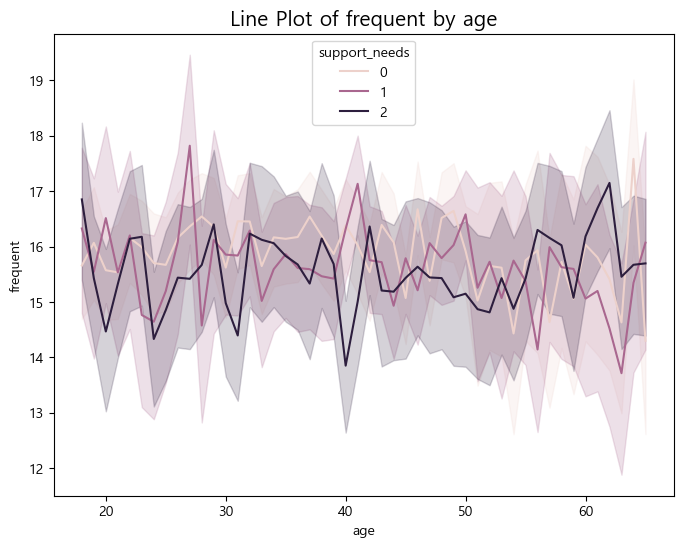

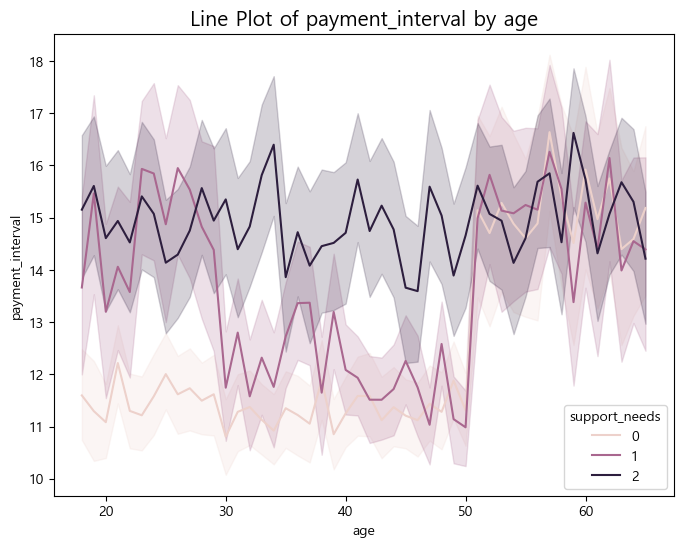

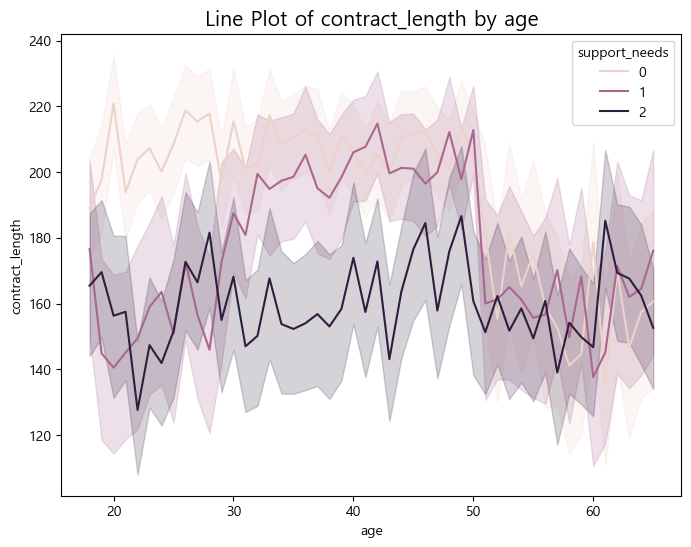

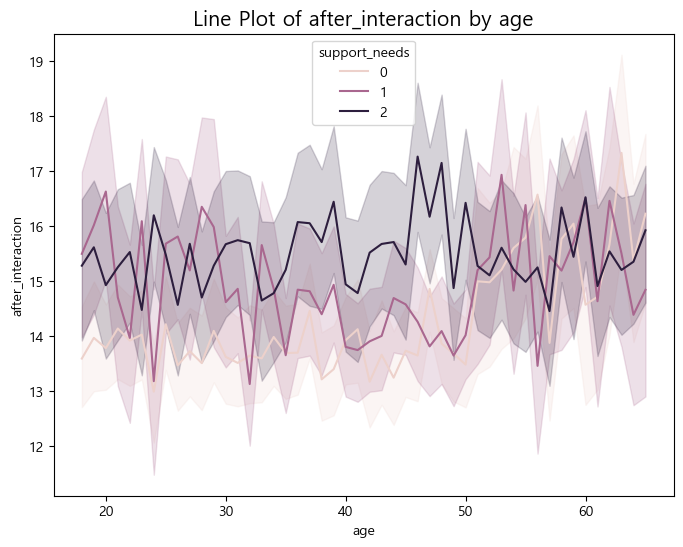

...

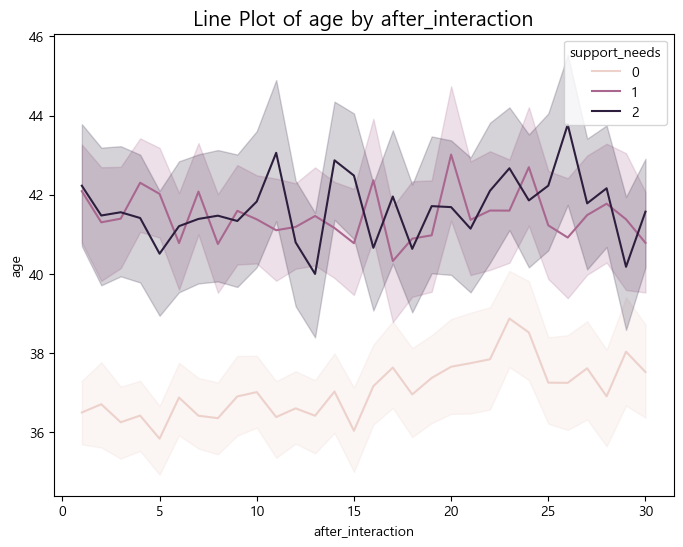

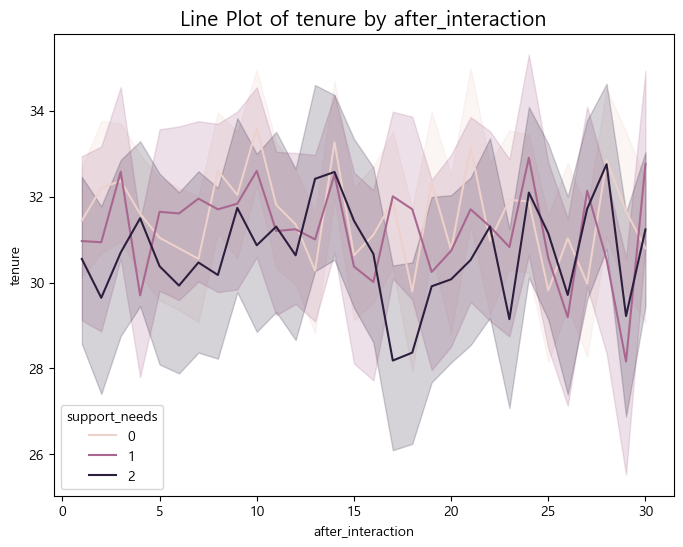

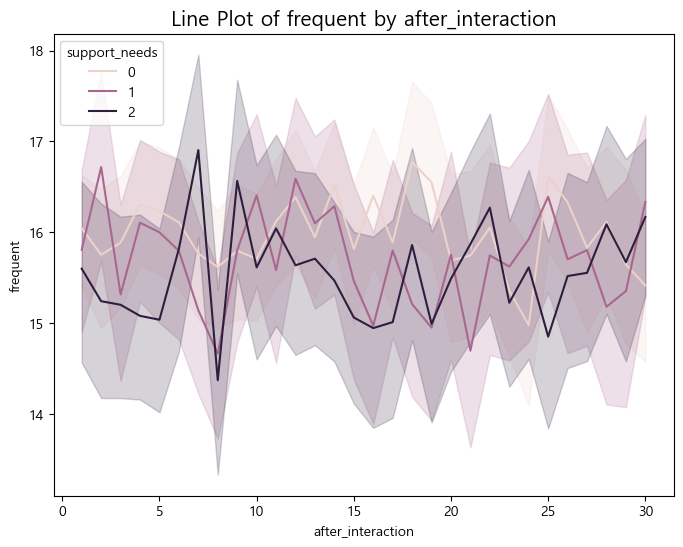

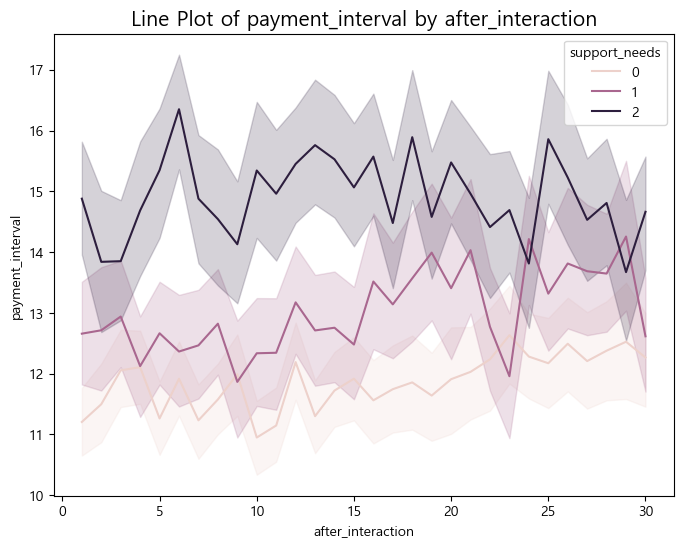

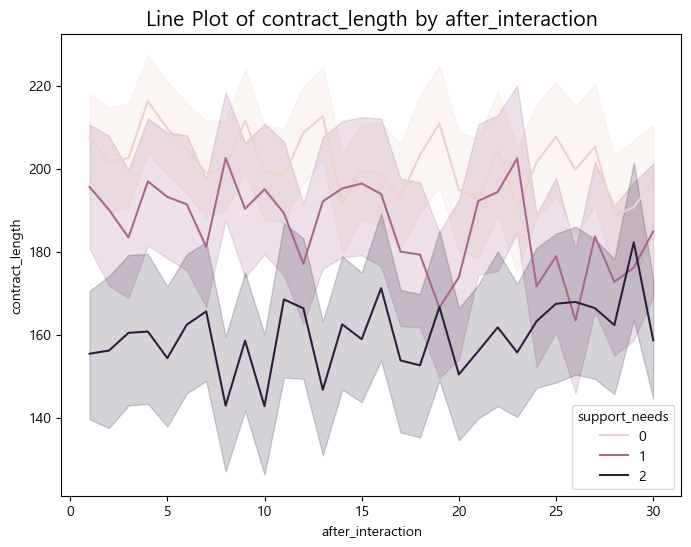

In [11]:
# 고객지원등급 별로 차이가 있나?
from itertools import permutations

var_combinations = permutations(numerical_vars, 2)

for x_var, y_var in var_combinations:
    plt.figure(figsize=(8, 6)) # 각 그래프를 새로운 창에 그리기 위해 figure 생성
    
    sns.lineplot(
        x=x_var,
        y=y_var,
        hue='support_needs',
        data=train
    )
    
    plt.title(f'Line Plot of {y_var} by {x_var}', fontsize=15)
    plt.show()


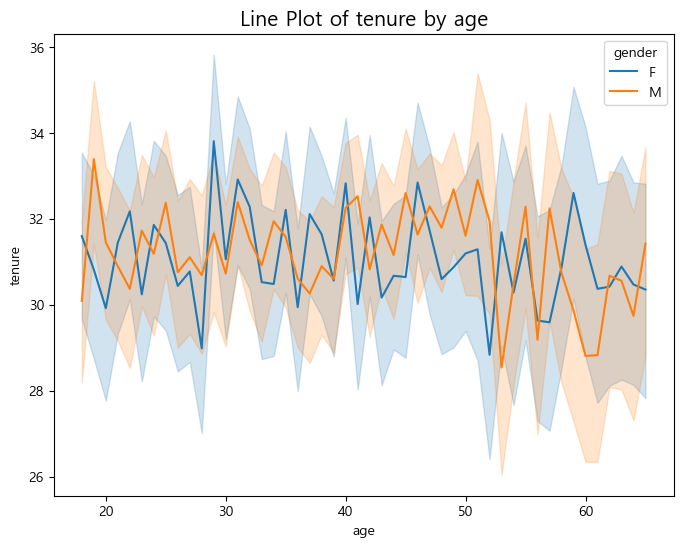

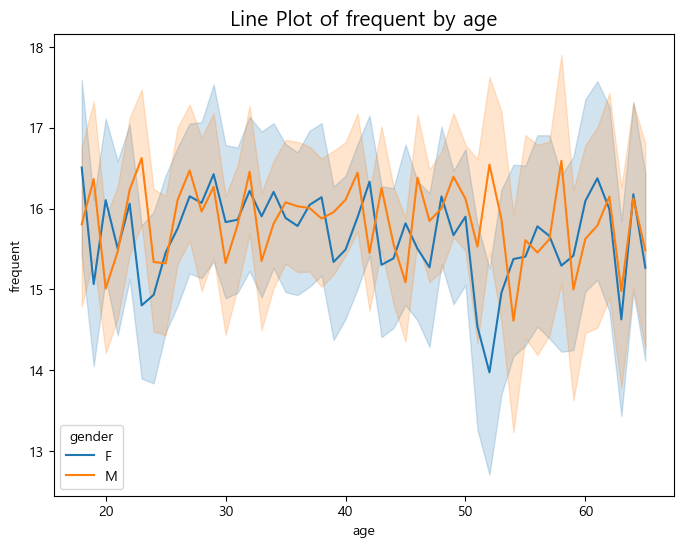

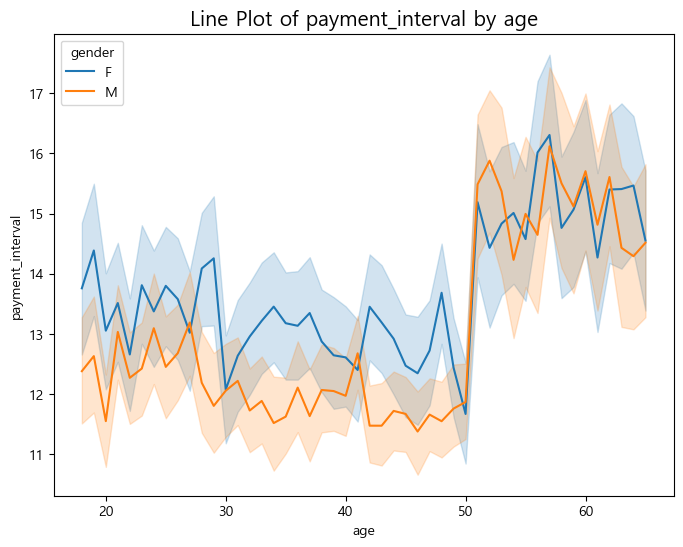

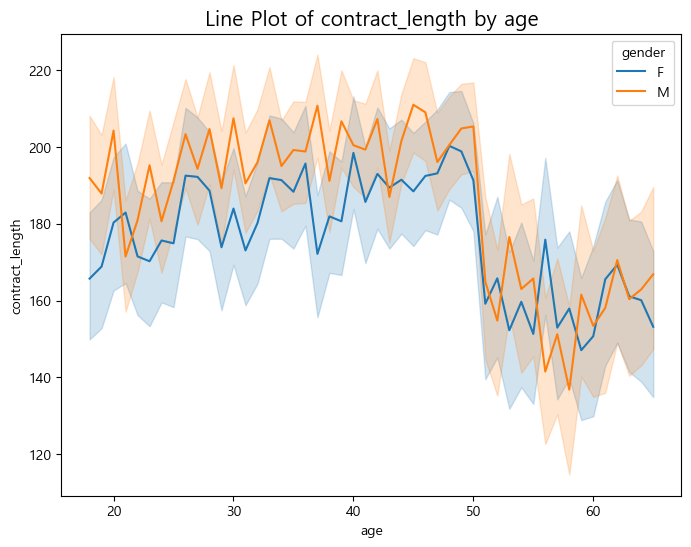

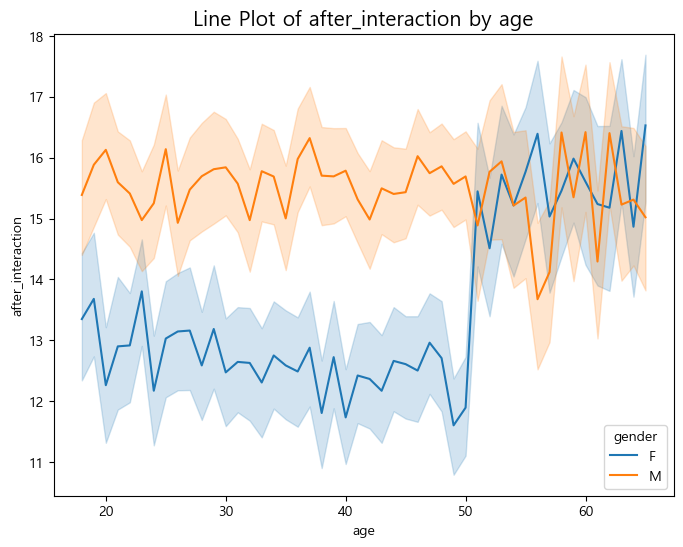

...

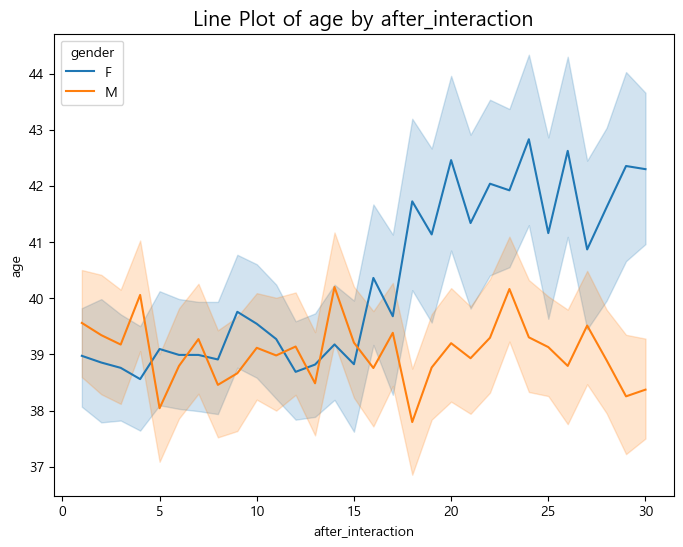

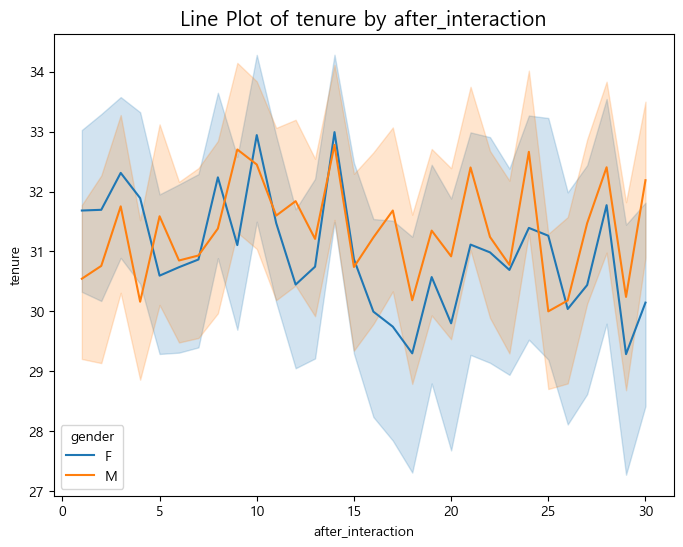

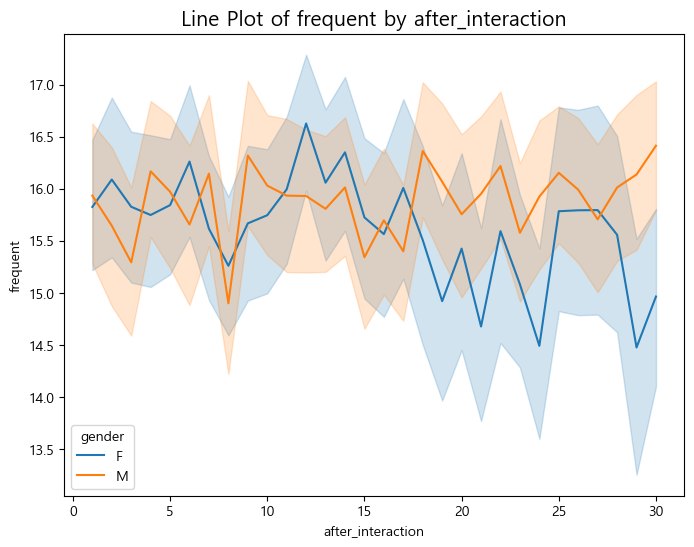

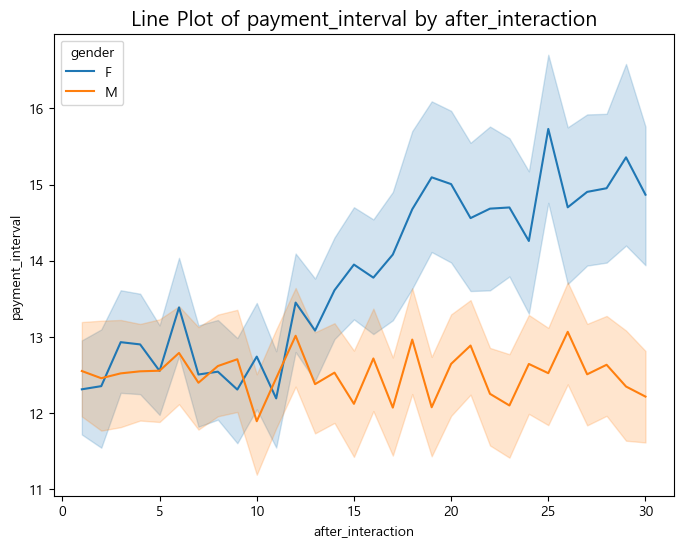

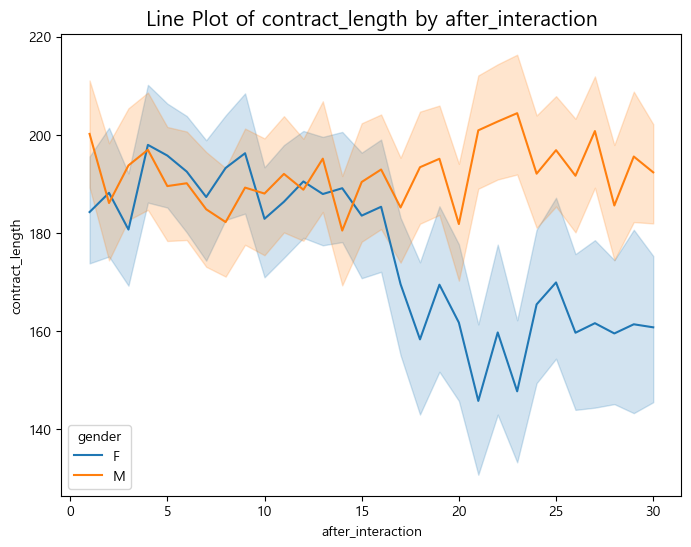

In [12]:
# 성별별로 차이가 있나?
from itertools import permutations

var_combinations = permutations(numerical_vars, 2)

for x_var, y_var in var_combinations:
    plt.figure(figsize=(8, 6)) # 각 그래프를 새로운 창에 그리기 위해 figure 생성
    
    sns.lineplot(
        x=x_var,
        y=y_var,
        hue='gender',
        data=train
    )
    
    plt.title(f'Line Plot of {y_var} by {x_var}', fontsize=15)
    plt.show()


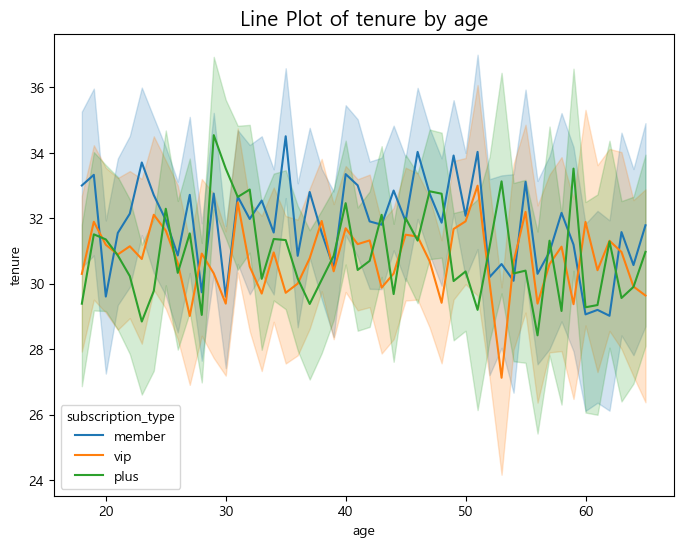

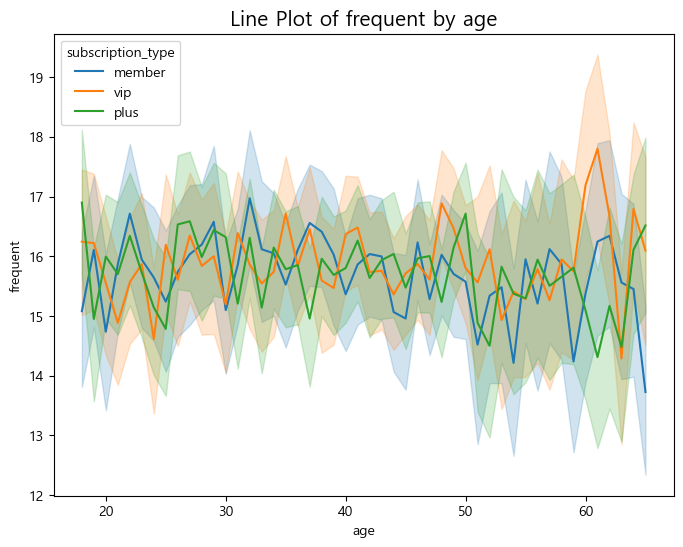

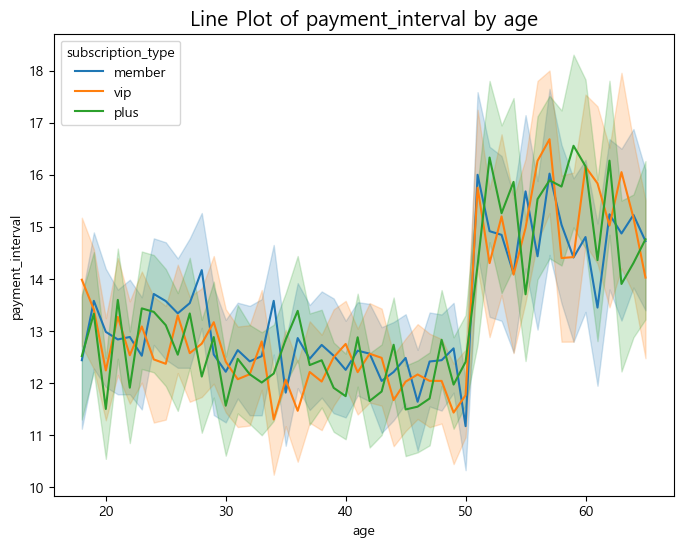

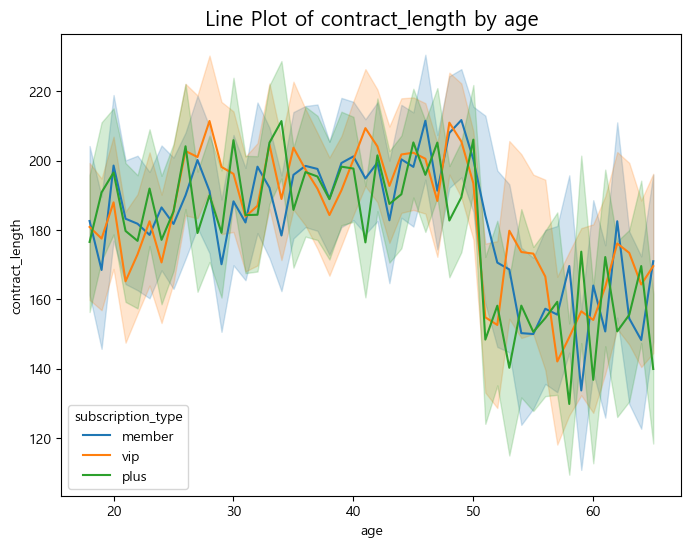

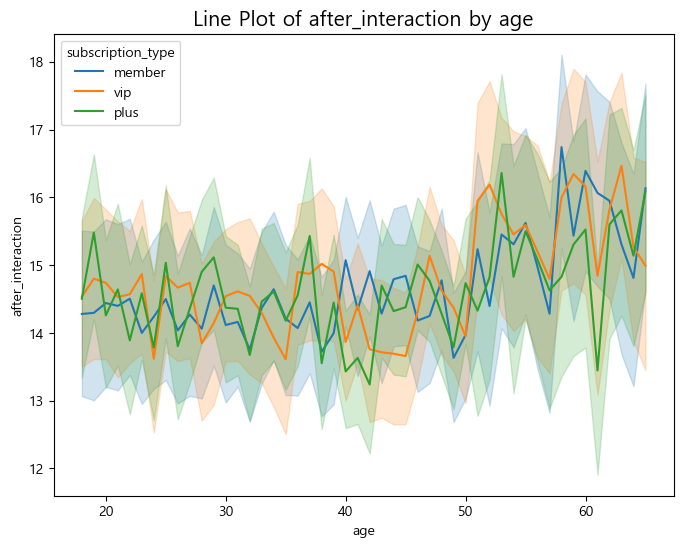

...

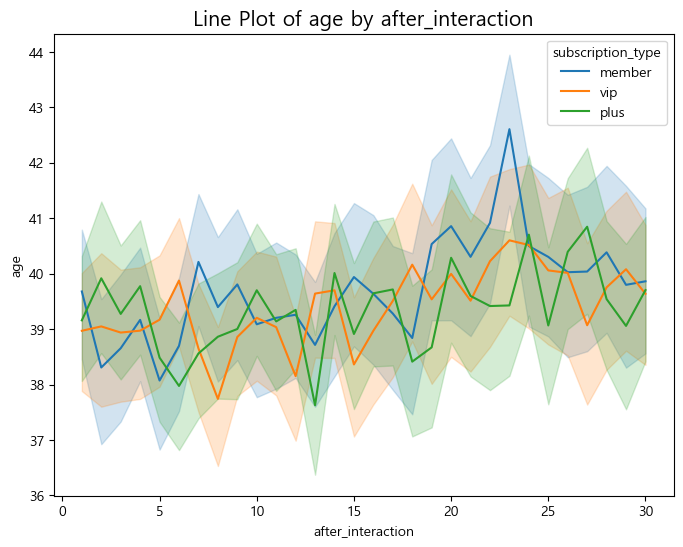

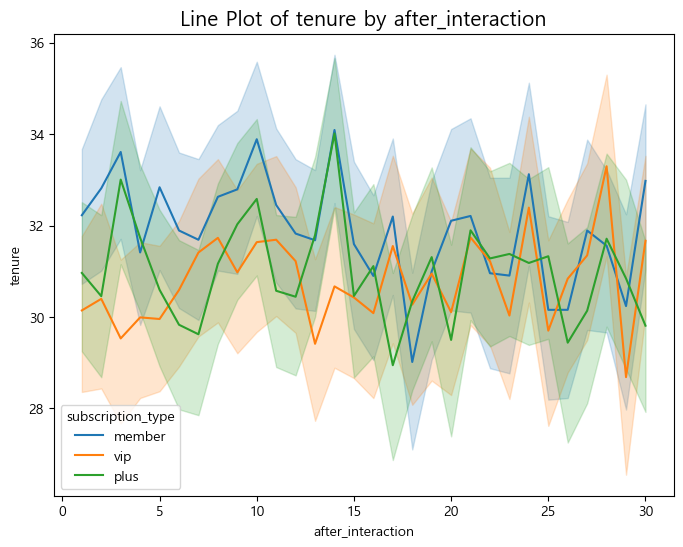

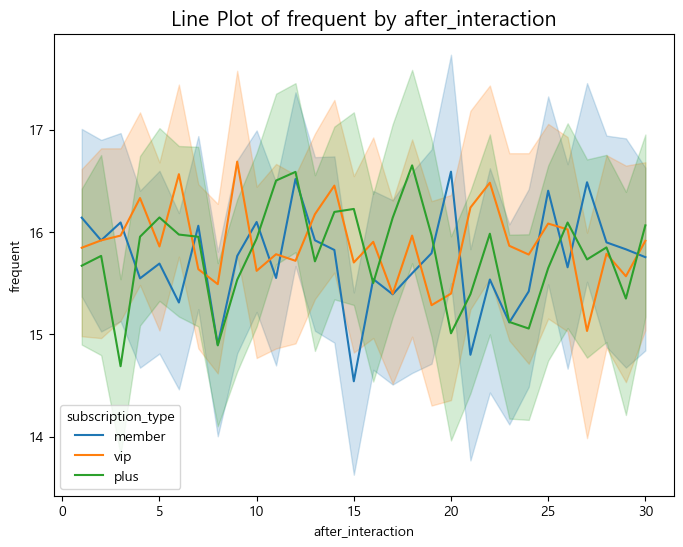

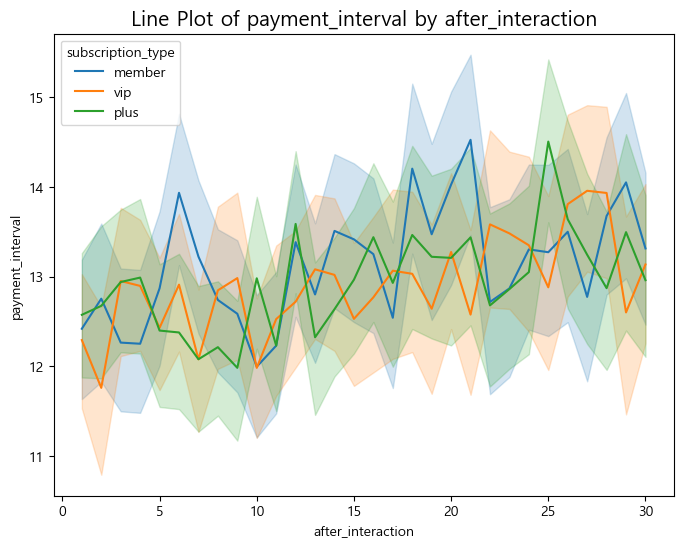

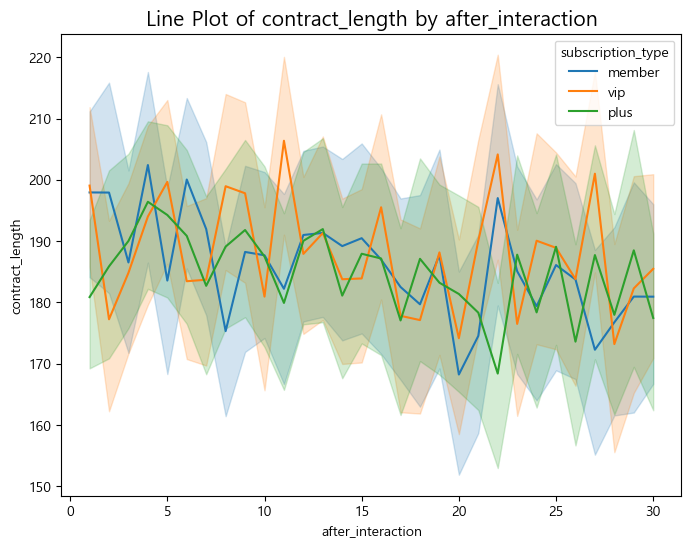

In [13]:
# 고객등급별로 차이가 있나요?
from itertools import permutations

var_combinations = permutations(numerical_vars, 2)

for x_var, y_var in var_combinations:
    plt.figure(figsize=(8, 6)) # 각 그래프를 새로운 창에 그리기 위해 figure 생성
    
    sns.lineplot(
        x=x_var,
        y=y_var,
        hue='subscription_type',
        data=train
    )
    
    plt.title(f'Line Plot of {y_var} by {x_var}', fontsize=15)
    plt.show()


# 피처 엔지니어링

In [14]:
train.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction,support_needs
0,TRAIN_00000,54.0,F,47.0,22.0,8.0,member,90,25.0,0
1,TRAIN_00001,30.0,M,16.0,15.0,5.0,vip,360,23.0,0
2,TRAIN_00002,29.0,M,8.0,30.0,21.0,plus,30,21.0,0
3,TRAIN_00003,38.0,F,38.0,23.0,10.0,vip,90,6.0,0
4,TRAIN_00004,25.0,F,52.0,3.0,17.0,member,30,1.0,2


In [15]:
test.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction
0,TEST_00000,18.0,M,40.0,6.0,15.0,member,30,18.0
1,TEST_00001,40.0,M,41.0,23.0,0.0,member,90,16.0
2,TEST_00002,59.0,F,30.0,1.0,21.0,member,360,25.0
3,TEST_00003,38.0,M,2.0,10.0,0.0,member,30,18.0
4,TEST_00004,30.0,M,28.0,21.0,20.0,member,360,28.0


In [16]:
#label 인코딩
train['gender'] =train['gender'].map({'F':0, "M": 1})
test ['gender'] = test['gender'].map({'F':0, "M": 1})

train['subscription_type'] =train['subscription_type'].map({'member' : 0, 'plus' : 1, 'vip' : 2})
test['subscription_type'] =test['subscription_type'].map({'member' : 0, 'plus' : 1, 'vip' : 2})


In [17]:
train.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction,support_needs
0,TRAIN_00000,54.0,0,47.0,22.0,8.0,0,90,25.0,0
1,TRAIN_00001,30.0,1,16.0,15.0,5.0,2,360,23.0,0
2,TRAIN_00002,29.0,1,8.0,30.0,21.0,1,30,21.0,0
3,TRAIN_00003,38.0,0,38.0,23.0,10.0,2,90,6.0,0
4,TRAIN_00004,25.0,0,52.0,3.0,17.0,0,30,1.0,2


In [18]:
test.head()

,ID,age,gender,tenure,frequent,payment_interval,subscription_type,contract_length,after_interaction
0,TEST_00000,18.0,1,40.0,6.0,15.0,0,30,18.0
1,TEST_00001,40.0,1,41.0,23.0,0.0,0,90,16.0
2,TEST_00002,59.0,0,30.0,1.0,21.0,0,360,25.0
3,TEST_00003,38.0,1,2.0,10.0,0.0,0,30,18.0
4,TEST_00004,30.0,1,28.0,21.0,20.0,0,360,28.0


In [ ]:
query = """
SELECT 
    age,
    gender ,
    contract_length ,
    contract_length*subscription_type as subscription_value,
    subscription_type*payment_interval as customer_lifetime_value,
    tenure / age AS membership_duration_ratio ,
    after_interaction / (frequent+1) as interaction_rate,
    frequent*after_interaction as activity_intensity,
    tenure/contract_length as tenure_contract_ratio,
    payment_interval * frequent as payment_frequent_interaction,
    payment_interval * (tenure+1) as payment_tenure_ratio,
    after_interaction * payment_interval as after_payment_interaction,
    support_needs
FROM train;
"""

train_fe = duckdb.query(query).to_df()
train_fe.head()

,age,age_group,gender,loyalty_level,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction,support_needs
0,54.0,3,0,3,90,0,0.0,0.870370,1.086957,550.0,0.522222,176.0,384.0,200.0,0
1,30.0,1,1,0,360,720,10.0,0.533333,1.437500,345.0,0.044444,75.0,85.0,115.0,0
2,29.0,1,1,0,30,30,21.0,0.275862,0.677419,630.0,0.266667,630.0,189.0,441.0,0
3,38.0,2,0,3,90,180,20.0,1.000000,0.250000,138.0,0.422222,230.0,390.0,60.0,0
4,25.0,0,0,3,30,0,0.0,2.080000,0.250000,3.0,1.733333,51.0,901.0,17.0,2


In [80]:
query = """
SELECT 
    age,
    gender ,
    contract_length ,
    contract_length*subscription_type as subscription_value,
    subscription_type*payment_interval as customer_lifetime_value,
    tenure / age AS membership_duration_ratio ,
    after_interaction / (frequent+1) as interaction_rate,
    frequent*after_interaction as activity_intensity,
    tenure/contract_length as tenure_contract_ratio,
    payment_interval * frequent as payment_frequent_interaction,
    payment_interval * (tenure+1) as payment_tenure_ratio,
    after_interaction * payment_interval as after_payment_interaction,
FROM test;
"""

test_fe = duckdb.query(query).to_df()
test_fe.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction
0,18.0,1,30,0,0.0,2.222222,2.571429,108.0,1.333333,90.0,615.0,270.0
1,40.0,1,90,0,0.0,1.025000,0.666667,368.0,0.455556,0.0,0.0,0.0
2,59.0,0,360,0,0.0,0.508475,12.500000,25.0,0.083333,21.0,651.0,525.0
3,38.0,1,30,0,0.0,0.052632,1.636364,180.0,0.066667,0.0,0.0,0.0
4,30.0,1,360,0,0.0,0.933333,1.272727,588.0,0.077778,420.0,580.0,560.0


In [21]:
x_train = train_fe.drop(columns =['support_needs'])
x_test = test_fe
y_train = train_fe['support_needs']

In [22]:
x_train.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction
0,54.0,0,90,0,0.0,0.870370,1.086957,550.0,0.522222,176.0,384.0,200.0
1,30.0,1,360,720,10.0,0.533333,1.437500,345.0,0.044444,75.0,85.0,115.0
2,29.0,1,30,30,21.0,0.275862,0.677419,630.0,0.266667,630.0,189.0,441.0
3,38.0,0,90,180,20.0,1.000000,0.250000,138.0,0.422222,230.0,390.0,60.0
4,25.0,0,30,0,0.0,2.080000,0.250000,3.0,1.733333,51.0,901.0,17.0


In [23]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF 결과를 저장할 빈 데이터프레임 생성
vif = pd.DataFrame()

# x_train의 각 열에 대해 VIF 계수 계산
# range 범위를 data가 아닌 x_train의 열 개수로 지정하는 것이 더 안전합니다.
vif['VIF Factor'] = [variance_inflation_factor(x_train.values, i) for i in range(x_train.shape[1])]

# VIF 계수에 해당하는 변수(피처) 이름을 새로운 열로 추가
vif['features'] = x_train.columns

# 결과 확인
print(vif)

    VIF Factor                      features
0     6.907578                           age
1     2.269750                        gender
2     7.246797               contract_length
3     4.182917            subscription_value
4     3.826880       customer_lifetime_value
5     5.532024     membership_duration_ratio
6     2.672578              interaction_rate
7     4.523508            activity_intensity
8     4.062149         tenure_contract_ratio
9     5.165108  payment_frequent_interaction
10    6.711134          payment_tenure_ratio
11    6.344101     after_payment_interaction


In [24]:
y_train.head()

0    0
1    0
2    0
3    0
4    2
Name: support_needs, dtype: int64

In [25]:
x_test.head()

,age,gender,contract_length,subscription_value,customer_lifetime_value,membership_duration_ratio,interaction_rate,activity_intensity,tenure_contract_ratio,payment_frequent_interaction,payment_tenure_ratio,after_payment_interaction
0,18.0,1,30,0,0.0,2.222222,2.571429,108.0,1.333333,90.0,615.0,270.0
1,40.0,1,90,0,0.0,1.025000,0.666667,368.0,0.455556,0.0,0.0,0.0
2,59.0,0,360,0,0.0,0.508475,12.500000,25.0,0.083333,21.0,651.0,525.0
3,38.0,1,30,0,0.0,0.052632,1.636364,180.0,0.066667,0.0,0.0,0.0
4,30.0,1,360,0,0.0,0.933333,1.272727,588.0,0.077778,420.0,580.0,560.0


<function matplotlib.pyplot.show(close=None, block=None)>

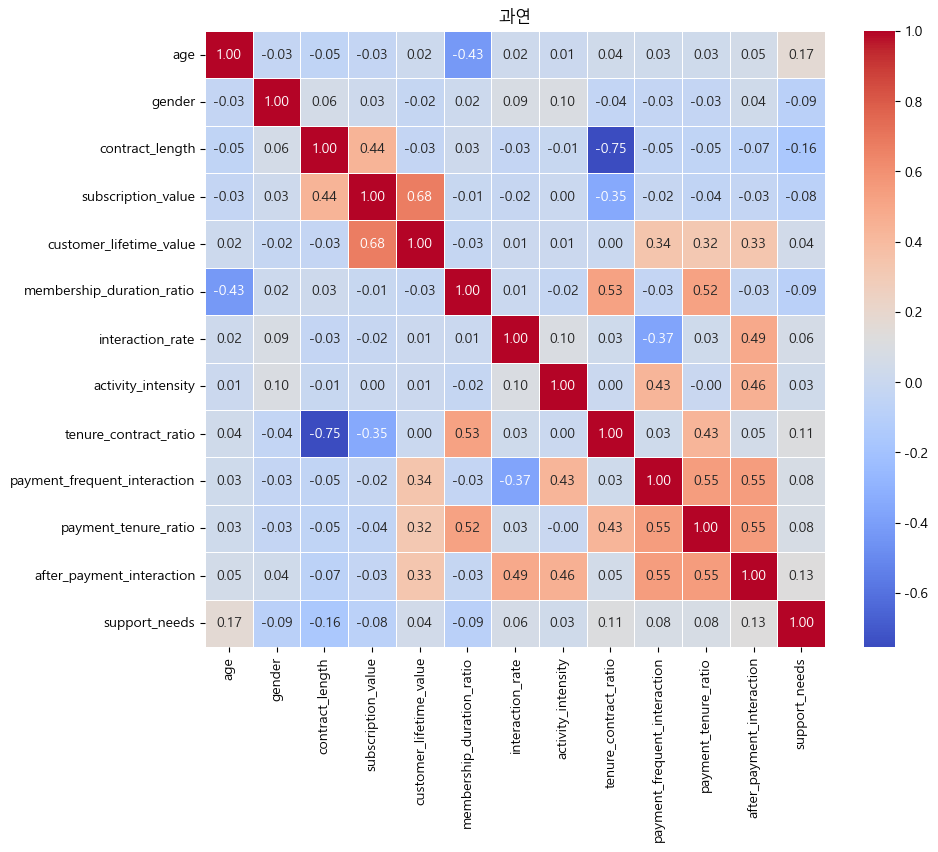

In [26]:
correlation_matrixx = train_fe.corr(method='spearman')

plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrixx,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',
    linewidths=.5
)
plt.title('과연')
plt.show

# XGC로 모델링 할거기때문에 scailing 진행하지 않음
# 트리 기반 모델이니까 정규성 신경쓰지 않아도 됨

###  알고리즘의 선택 기준
머신러닝 알고리즘을 선택할 때는 데이터의 특성과 목표에 따라 가장 적합한 모델을 선택하는 것이 중요해요. 네 가지 알고리즘(SVM, Decision Tree, Random Forest, Gradient Boosting)은 각기 다른 강점과 특성을 가지고 있어서 상황에 맞게 활용할 수 있어요. 아래는 주요 선택 기준입니다.

 

SVM (Support Vector Machine)은 고차원 데이터와 샘플 크기가 적은 상황에서 적합한 알고리즘이에요. 고차원 데이터를 효과적으로 처리하며, 커널 기법을 통해 비선형 문제도 해결할 수 있는 유연성을 가지고 있습니다. 특히 텍스트 분류나 이미지 분류와 같은 이진 분류 문제에서 강력한 성능을 발휘합니다. 하지만 데이터 샘플이 많거나 Feature 수가 지나치게 많아지면 학습 속도가 느려지고, 하이퍼파라미터(C와 커널 유형) 튜닝에 민감하다는 점은 한계로 작용할 수 있어요.

 

Decision Tree는 단순하고 해석 가능한 모델이 필요한 경우에 적합합니다. 트리 구조 덕분에 데이터를 빠르게 분석하고, 시각화하여 직관적으로 이해할 수 있는 점이 큰 장점이에요. 분류와 회귀 문제 모두에서 활용 가능하며, 데이터 전처리가 부족하거나 결측값이 포함된 데이터에서도 잘 작동합니다. 그러나 단독으로 사용할 경우 트리가 너무 깊어질 수 있어 과적합 위험이 있고, 성능이 제한적이라는 점을 염두에 두어야 합니다.

 

Random Forest는 안정적이고 정확한 결과를 원할 때 선택하기 좋은 알고리즘이에요. 여러 Decision Tree를 결합해 노이즈와 복잡한 데이터에 강하며, 과적합을 방지하면서도 높은 정확도를 제공합니다. 또한 결측값이 있거나 Feature가 많은 데이터에서도 잘 작동합니다. 다만, 여러 Tree를 조합하는 과정에서 학습 속도가 느리고, 모델이 내린 결정을 해석하기 어렵다는 단점이 있어요.

 

Gradient Boosting은 데이터가 복잡하거나 대규모 데이터셋에서 최고의 성능이 필요할 때 선택하기 적합합니다. 약한 학습기들을 순차적으로 학습하여 높은 예측 성능을 제공하며, 데이터의 복잡한 패턴을 잘 포착하는 강점을 가지고 있어요. 특히 머신러닝 대회(Kaggle 등)에서 자주 사용되는 모델로, 분류와 회귀 문제 모두에서 탁월한 성능을 발휘합니다. 하지만 학습 속도가 느리고, 과적합의 위험이 있으므로 적절한 하이퍼파라미터 튜닝이 필수적입니다.




n_estimators : 학습 모델의 수, 많아질수록 성능 향상의 가능성이 있으나, 속도가 느려짐

learning_rate : 학습률, 너무 크면 gradient 발산의 가능성이 있으며, 너무 작으면 학습이 느림

max_depth : 최대 탐색 깊이, 너무 크면 과적합의 가능성, 너무 작으면 학습 성능 저하

min_samples_split : 분할 종료 최소 샘플 수, 큰 수면 과적합을 막지만 학습 성능 저하 가능성

min_samples_leaf : leaf node가 되기 위한 최소 샘플 수, min_samples_split과 비슷한 용도

random_state : 특정 숫자로 고정 시에 실행 시마다 고정된 결과 반환

# 종속변수 weights 생각해야함, 클래스 불균형이 있으니까!
# 방법: 언더샘플링, 오버샘플링, 가중치
# 가중치를 줍시다

In [41]:
x_train['gender'].value_counts()

gender
1    17432
0    13426
Name: count, dtype: int64

In [27]:
from sklearn.utils.class_weight import compute_class_weight
# 1. y_train에 있는 각 클래스의 고유값과 그 개수를 확인
y_train.value_counts()
classes_y_train = [0,1,2]
counts = [14297, 8297, 8297]
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
print("클래스 종류:", np.unique(y_train))
print("계산된 클래스별 가중치:", class_weights)


weights = np.zeros(len(y_train))
for i, cls in enumerate(np.unique(y_train)):
    weights[y_train == cls] = class_weights[i]

클래스 종류: [0 1 2]
계산된 클래스별 가중치: [0.71945163 1.2397252  1.2446757 ]


# lgbm을 써보자, 과적합 조심

In [28]:
# from lightgbm.callback import early_stopping
# from sklearn.model_selection import StratifiedKFold, GridSearchCV
# from sklearn.metrics import f1_score, make_scorer
# from lightgbm import LGBMClassifier
# # import xgboost as xgb # 사용하지 않으므로 삭제하거나 주석 처리합니다.

# # ----------------- 이 부분부터 수정 -----------------

# # 1. GridSearchCV에 전달할 기본 모델을 생성합니다.
# #    튜닝할 파라미터(param_grid에 있는 것들)는 여기서 설정하지 않아도 됩니다.
# #    고정해둘 파라미터만 설정합니다.
# lgbm = LGBMClassifier(
#     random_state=42,
#     objective='multiclass',    # LightGBM의 다중 분류 objective는 'multiclass'입니다.
#     # num_class=3,             # LightGBM은 이 파라미터를 자동으로 감지하므로 불필요합니다. ㅇㅎ 
#     device='gpu',              # GPU 사용 시 'gpu_hist' 대신 'gpu'를 사용합니다.
#     subsample=0.9,
#     colsample_bytree=0.8,
#     reg_alpha=0.0,
#     reg_lambda=1.0
#     early_stopping = 
# )

# # 클래스 불균형 고려: f1_macro, StratifiedKFold
# cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
# scorer = make_scorer(f1_score, average='macro')

# # 튜닝할 하이퍼파라미터 그리드를 정의합니다.
# param_grid = {
#     'max_depth': [5, 7, 10],
#     'n_estimators': [500, 1000],
#     'learning_rate': [0.05,0.01,0.1],
#     'num_leaves': [20, 31, 40]            # max_depth와 연관되며, LightGBM의 복잡도를 조절하는 핵심 파라미터. (기본값 31)
# } 


# # 2. GridSearchCV의 estimator에는 모델의 '인스턴스'를 전달해야 합니다.
# grid_search = GridSearchCV(
#     estimator=lgbm,  # 미리 생성한 lgbm 인스턴스를 전달
#     param_grid=param_grid,
#     cv=cv,
#     scoring=scorer,
#     verbose=2, # 정보를 함축적으로 보여줌줌
#     n_jobs=1 # GPU 사용할땐 1로 두어라라
# )

# # ----------------- 수정 완료 -----------------


# # 아래 코드는 기존과 동일합니다.
# # x_train, y_train, weights 변수가 미리 정의되어 있어야 합니다.
# grid_search.fit(x_train, y_train, sample_weight=weights) 
# print("최적 하이퍼파라미터:", grid_search.best_params_)
# print("최고 f1_macro:", grid_search.best_score_)

# best_model = grid_search.best_estimator_
# preds_tuned = best_model.predict(x_test)

In [36]:
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold, GridSearchCV, train_test_split # train_test_split 추가
from sklearn.metrics import f1_score, make_scorer
from lightgbm import LGBMClassifier
import numpy as np # weights_val을 위해 추가

# --- 이 부분부터 크게 수정됩니다 ---

# 1. Early Stopping에 사용할 검증 데이터셋을 미리 분리합니다.
#    기존 x_train, y_train, weights를 새로운 훈련용과 검증용으로 나눕니다.
#    stratify=y_train 옵션으로 클래스 비율을 유지합니다.
x_train_new, x_val, y_train_new, y_val = train_test_split(
    x_train, y_train, test_size=0.2, random_state=42, stratify=y_train
)

# 2. sample_weight도 동일한 인덱스로 분리합니다.
#    train_test_split은 인덱스를 반환하지 않으므로, 원래 데이터의 인덱스를 사용해 분리합니다.
weights_new = weights[x_train_new.index]
weights_val = weights[x_val.index]


# 3. 기본 모델 정의 (이전과 동일)
lgbm = LGBMClassifier(
    random_state=42,
    objective='multiclass',
    device='gpu',
    subsample=0.9,
    colsample_bytree=0.8,
    reg_alpha=0.0,
    reg_lambda=1.0,
    n_estimators=1000
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scorer = make_scorer(f1_score, average='macro')

param_grid = {
    'max_depth': [5, 7, 10],
    'learning_rate': [0.05, 0.01, 0.1],
    'num_leaves': [20, 31, 40]
}

# 4. fit_params에 분리해둔 검증 데이터셋(eval_set)을 명시적으로 지정합니다.
#    가중치(sample_weight)를 사용하므로, eval_sample_weight도 함께 지정합니다.
fit_params = {
    "callbacks": [
        lgb.early_stopping(stopping_rounds=50, verbose=False)
    ],
    "eval_set": [(x_val, y_val)],
    "eval_metric": "multi_logloss",
    "eval_sample_weight": [weights_val] # 리스트 형태로 전달해야 합니다.
}

grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    cv=cv,
    scoring=scorer,
    verbose=2,
    n_jobs=1
)

# 5. GridSearchCV를 **새로운 훈련 데이터(x_train_new)**로 학습시킵니다.
grid_search.fit(x_train_new, y_train_new, sample_weight=weights_new, **fit_params)

print("최적 하이퍼파라미터:", grid_search.best_params_)
print("최고 f1_macro:", grid_search.best_score_)

# 6. (중요!) 최종 모델은 찾은 최적 파라미터로 **원래의 전체 훈련 데이터**로 다시 학습시켜야 합니다.
best_model = grid_search.best_estimator_
best_model.fit(x_train, y_train, sample_weight=weights) # 전체 데이터로 재학습

preds_tuned = best_model.predict(x_test)

print("최종 모델의 n_estimators:", best_model.n_estimators_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1761
[LightGBM] [Info] Number of data points in the train set: 19748, number of used features: 12
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 4070 Ti, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 12 dense feature groups (0.23 MB) transferred to GPU in 0.001146 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score -1.098689
[LightGBM] [Info] Start training from score -1.098585
[LightGBM] [Info] Start training from score -1.098563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

In [37]:
preds_final = best_model.predict(x_test)

# 교차검증 OOF f1_macro도 출력
from sklearn.model_selection import cross_val_score
scores = cross_val_score(best_model, x_train, y_train, scoring='f1_macro', cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)) # f1_macro 인 이유는 y값의 범주가 3이기 때문이다.
print(f"CV f1_macro: {scores.mean():.4f} +/- {scores.std():.4f}")

[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1765
[LightGBM] [Info] Number of data points in the train set: 24686, number of used features: 12
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 4070 Ti, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 12 dense feature groups (0.28 MB) transferred to GPU in 0.000808 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score -0.769383
[LightGBM] [Info] Start training from score -1.313426
[LightGBM] [Info] Start training from score -1.317501
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1764
[LightGBM] [Info] Number of data points in the train set: 24686, number of used features: 12
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 4070 Ti, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with

In [38]:
# 제출 파일 생성
submission = pd.read_csv(data_path/'sample_submission.csv')
submission['support_needs'] = preds_final
submission.to_csv('xgb_tuned_submission.csv', index=False)

print("lightgbm 최적 모델 예측 완료 및 제출 파일 생성!")

lightgbm 최적 모델 예측 완료 및 제출 파일 생성!
